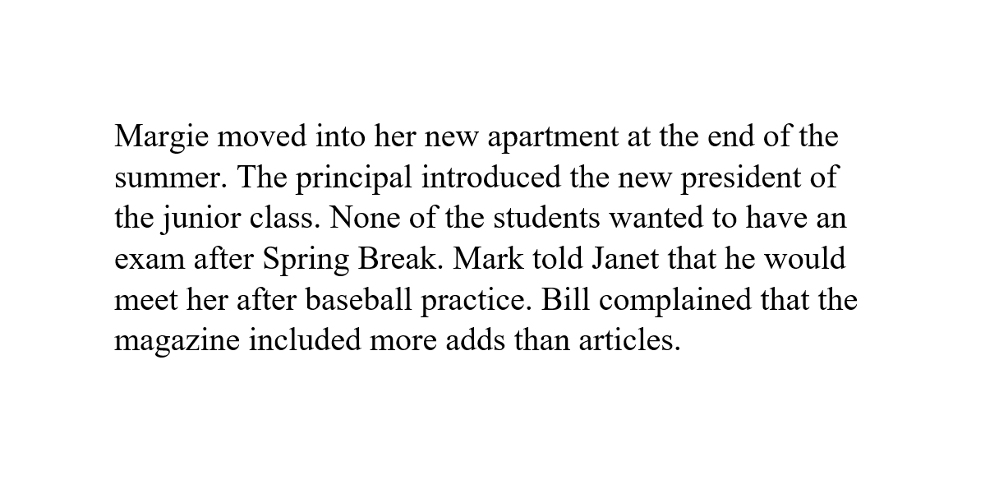

In [1]:
from IPython.display import Image
img = Image(filename='synthetic_text.png')
img

In [2]:
import emip_toolkit as EMTK

In [3]:
image_path = "./"
image = "synthetic_text.png"
aoi = EMTK.find_aoi(image, image_path, level="sub-line")
aoi.head()

,kind,name,x,y,width,height,image
0,sub-line,line 1 part 1,137.5,147,119,44,synthetic_text.png
1,sub-line,line 1 part 2,262.5,147,114,44,synthetic_text.png
2,sub-line,line 1 part 3,382.5,147,65,44,synthetic_text.png
3,sub-line,line 1 part 4,453.5,147,57,44,synthetic_text.png
4,sub-line,line 1 part 5,514.5,147,72,44,synthetic_text.png


In [4]:
file_path = "./"

aois_with_tokens = EMTK.add_tokens_to_AOIs(file_path, image.split(".")[0]+".txt", aoi)
aois_with_tokens.head()

,kind,name,x,y,width,height,image,token
0,sub-line,line 1 part 1,137.5,147,119,44,synthetic_text.png,Margie
1,sub-line,line 1 part 2,262.5,147,114,44,synthetic_text.png,moved
2,sub-line,line 1 part 3,382.5,147,65,44,synthetic_text.png,into
3,sub-line,line 1 part 4,453.5,147,57,44,synthetic_text.png,her
4,sub-line,line 1 part 5,514.5,147,72,44,synthetic_text.png,new


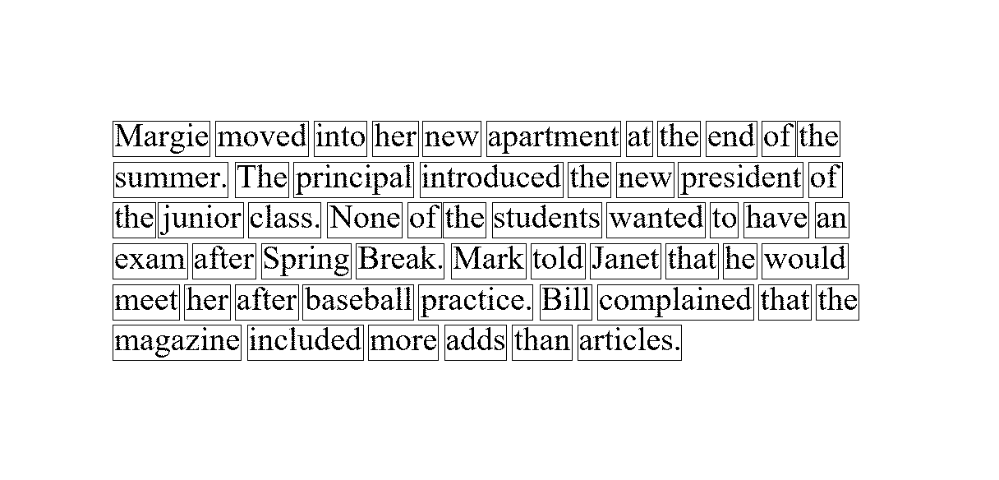

In [5]:
EMTK.draw_aoi(aoi, image, image_path)

In [6]:
import correction

In [23]:
synth_fixations = correction.generate_fixations_left_skip_regression(aois_with_tokens)

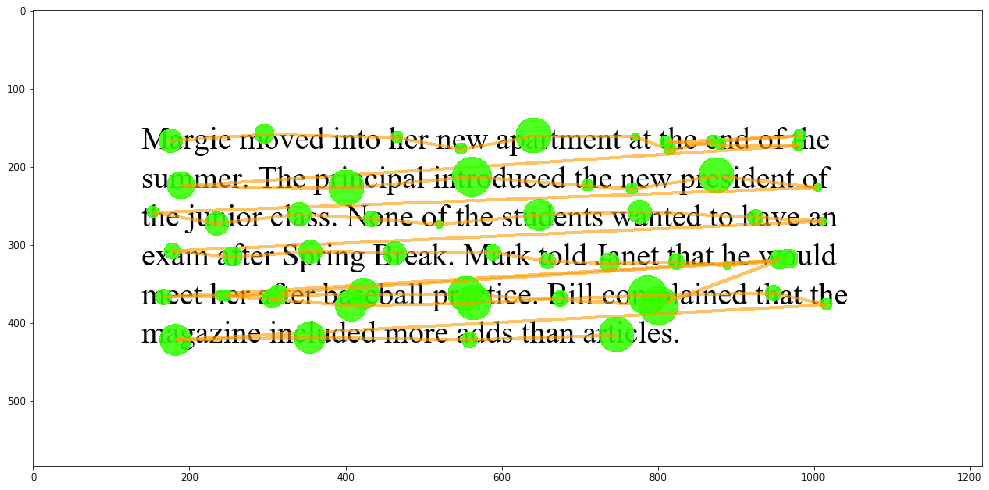

In [24]:
correction.draw_fixation('synthetic_text.png', synth_fixations)

# Generating a synthetic dataset with 100 readers

C:\Users\nsser\OneDrive\Desktop\Research\Model-Based Correction\Synthetic_with_time\correction.py:272: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(17, 15))


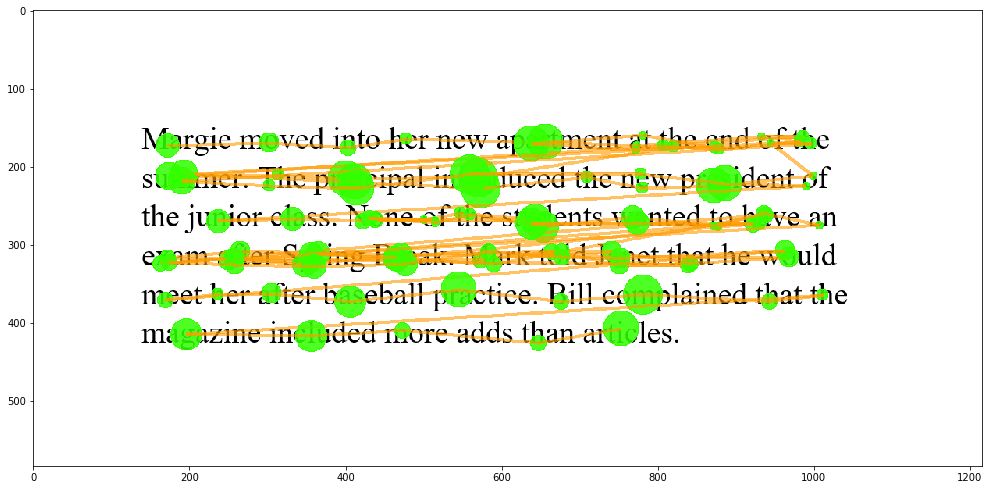

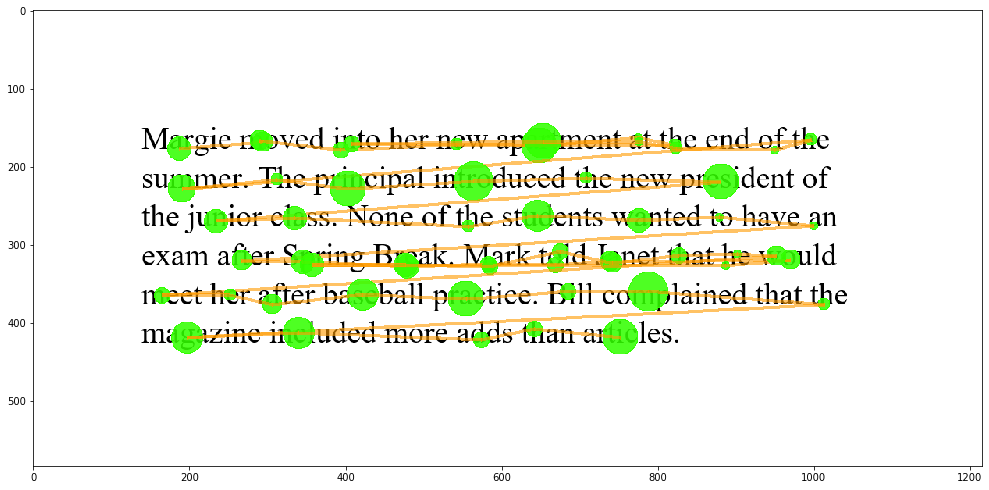

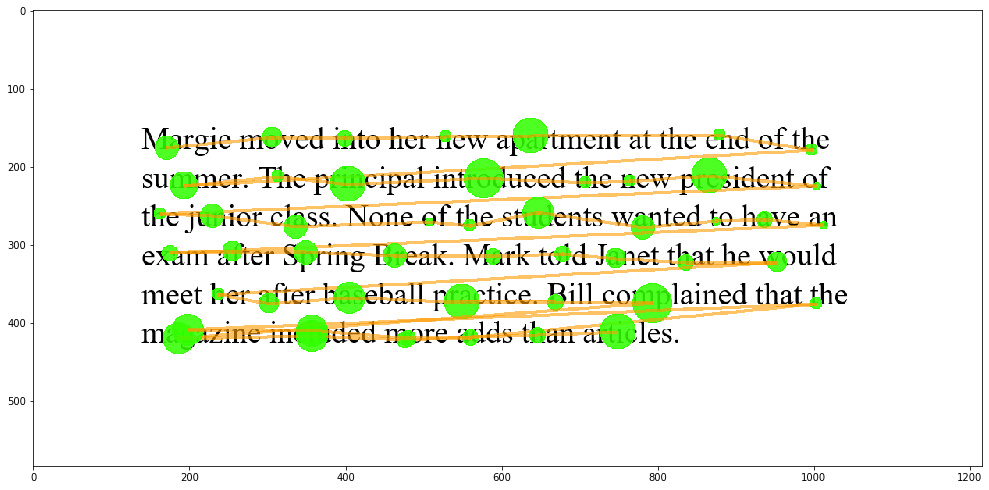

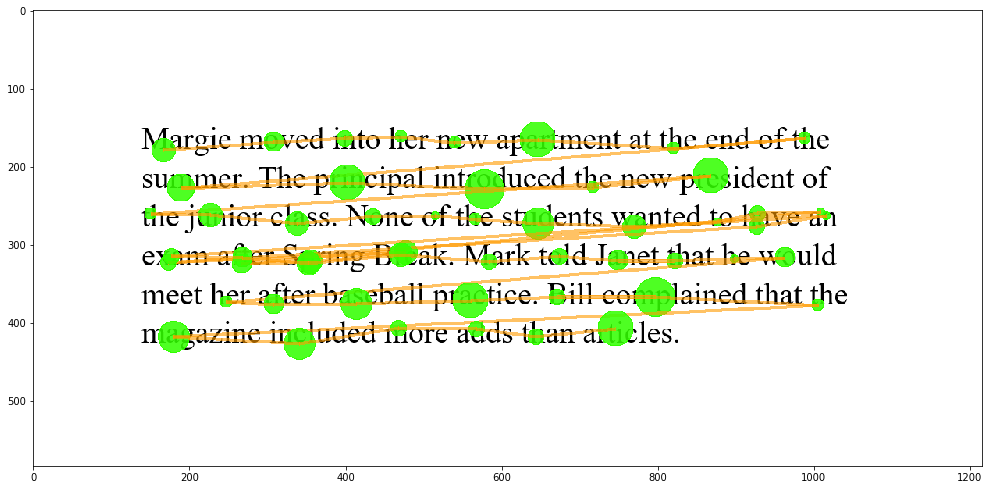

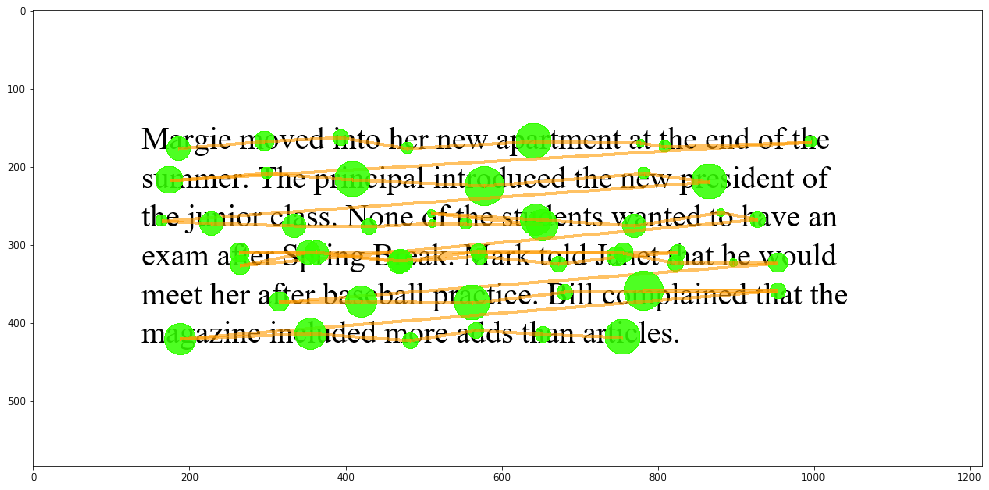

...

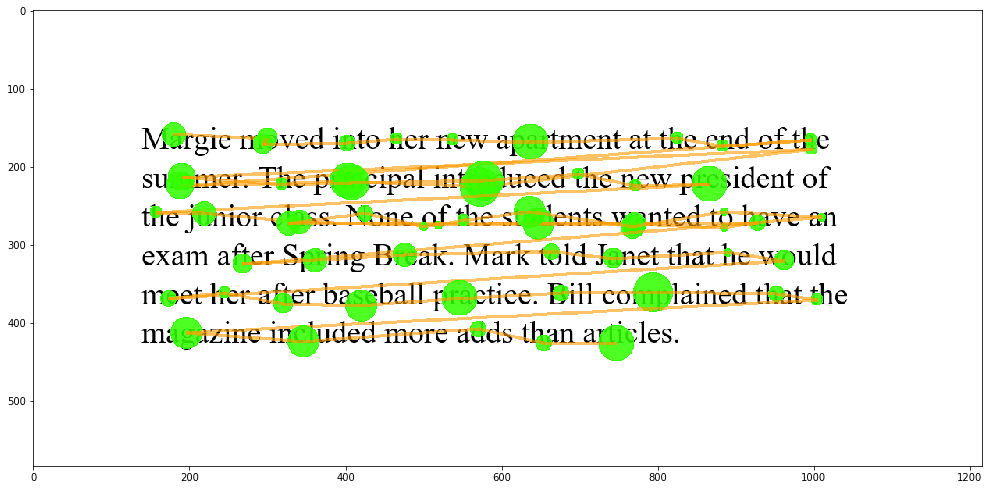

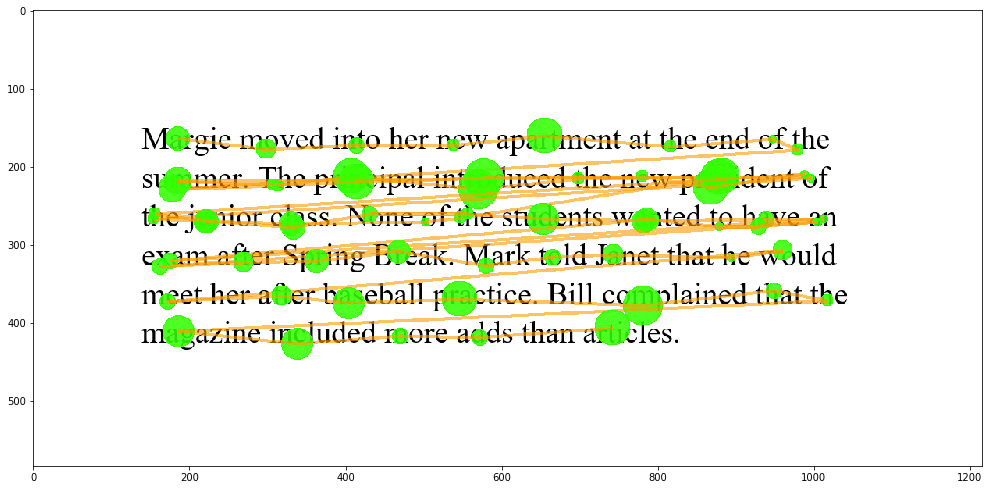

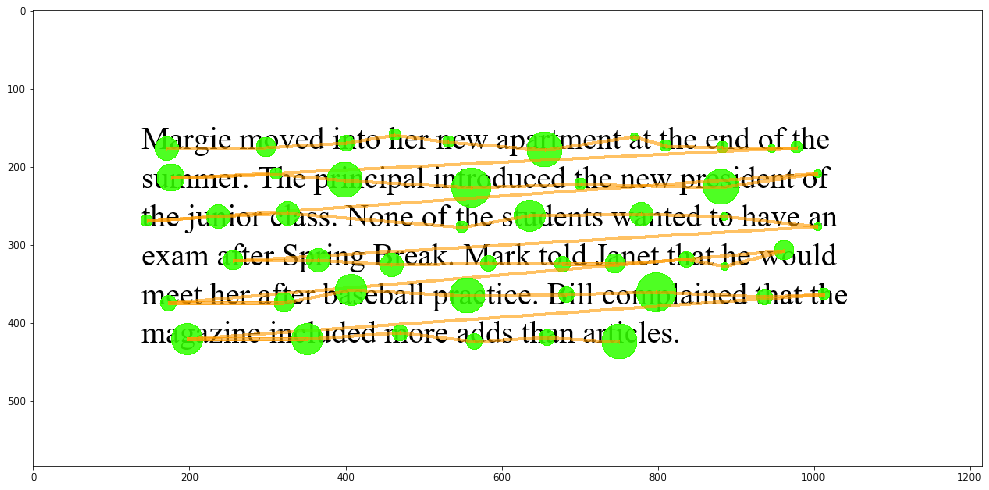

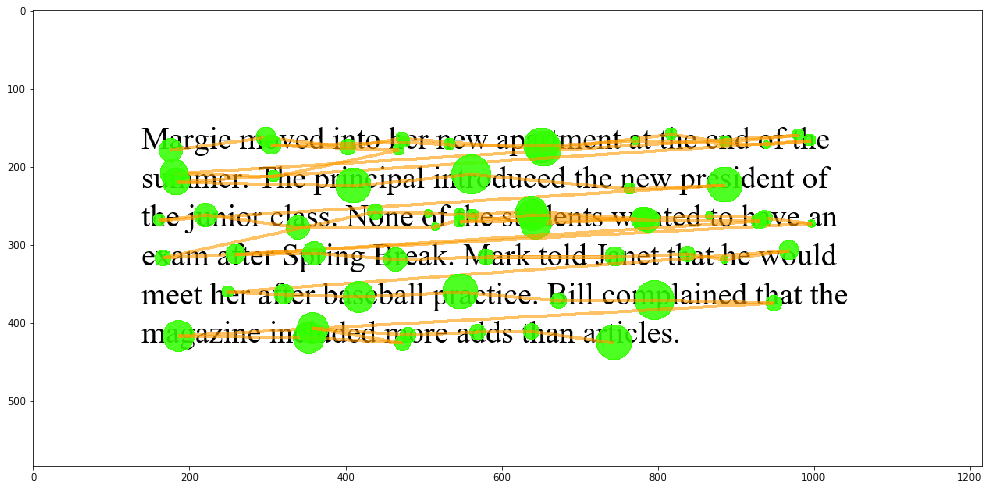

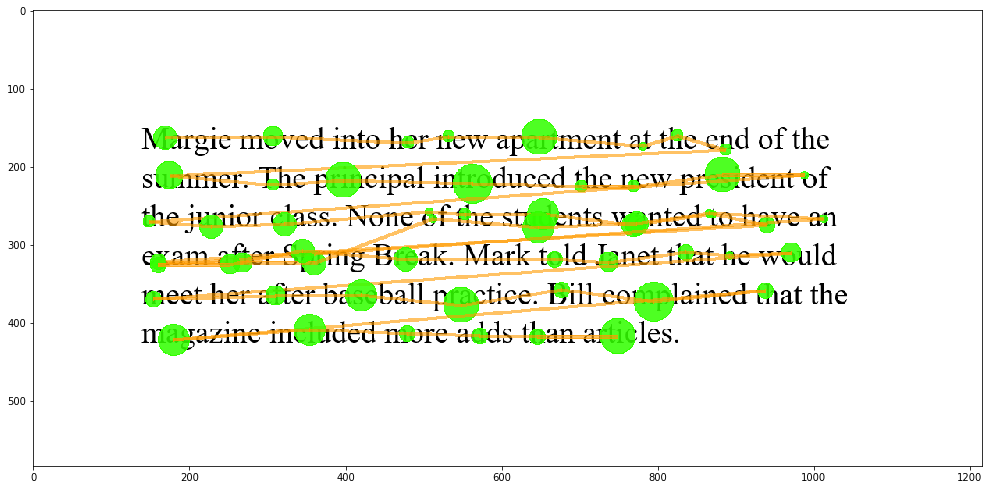

In [29]:
data = {}


for index in range(100):
    synth_fixations = correction.generate_fixations_left_skip_regression(aois_with_tokens)
    
    data["robot" + str(index)] = synth_fixations
    
    correction.draw_fixation('synthetic_text.png', synth_fixations)
    correction.plt.savefig("imgs/robot" + str(index) + ".png")

In [31]:
data["robot1"]

[[187.16666666666666, 177.0, 300],
 [294.5, 169.0, 250],
 [290.5, 167.0, 250],
 [394.1666666666667, 179.0, 200],
 [542.5, 172.0, 150],
 [649.1666666666666, 174.0, 450],
 [775.5, 163.0, 100],
 [823.1666666666666, 173.0, 150],
 [408.1666666666667, 171.0, 200],
 [654.1666666666666, 168.0, 450],
 [776.5, 168.0, 100],
 [824.1666666666666, 177.0, 150],
 [950.5, 179.0, 100],
 [997.1666666666666, 166.0, 150],
 [191.16666666666666, 229.0, 350],
 [312.5, 217.0, 150],
 [403.5, 229.0, 450],
 [564.8333333333334, 219.0, 500],
 [709.1666666666666, 215.0, 150],
 [881.5, 220.0, 450],
 [234.5, 270.0, 300],
 [335.1666666666667, 266.0, 300],
 [558.1666666666666, 277.0, 150],
 [646.1666666666666, 263.0, 400],
 [776.8333333333334, 269.0, 300],
 [879.1666666666666, 265.0, 100],
 [1000.5, 276.0, 100],
 [267.5, 321.0, 250],
 [345.1666666666667, 322.0, 300],
 [479.5, 328.0, 300],
 [583.1666666666666, 325.0, 200],
 [669.8333333333334, 326.0, 200],
 [739.5, 322.0, 250],
 [970.8333333333334, 320.0, 250],
 [887.5, 

In [32]:
import json

# convert into JSON:
output = json.dumps(data)

out_file = open("synthetic_dataset_with_time.txt", 'w')

out_file.write(output)

out_file.close()

# the result is a JSON string:
# print(output)

In [ ]:
# reading the JSON file into a dictionary

#read_data = json.loads(output)

# the result is a Python dictionary:
#print(read_data['robot1'][2])